## Presentación
### TC5035 Proyecto Integrador
- Dra. Grettel Barceló Alonso
- Dr. Luis Eduardo Falcón Morales

### Equipo 31
- A00194173 Adriana González Ugalde

- A01123424 José Alberto Herrera Bernal

- A00534649 Carlos Alberto Parra Arredondo

  

## Introducción

El presente notebook tiene como objetivo realizar un análisis exploratorio de datos, también conocido como EDA (*Exploratory Data Analysis*), sobre el Stanford Dogs Dataset. Este conjunto de datos pertenece al área de visión computacional y está orientado a la clasificación de imágenes de perros por raza.

A diferencia de un conjunto de datos tabular tradicional, este dataset está compuesto principalmente por imágenes, por lo que el análisis exploratorio no solo considera estadísticas descriptivas, sino también características visuales como el tamaño de las imágenes, la proporción ancho-alto, la distribución de clases, la posible existencia de imágenes corruptas, la calidad visual y el equilibrio entre categorías.

El análisis permitirá identificar patrones relevantes, posibles problemas en los datos y operaciones de preprocesamiento necesarias antes de entrenar un modelo de aprendizaje automático o aprendizaje profundo.

## Objetivos del EDA para el proyecto

Los objetivos principales de este análisis son:

1. Describir la estructura general del Stanford Dogs Dataset.
2. Identificar el número total de imágenes y razas disponibles.
3. Analizar la distribución de imágenes por clase.
4. Revisar si existen imágenes faltantes, corruptas o sin etiqueta.
5. Explorar las dimensiones de las imágenes, como ancho, alto y proporción.
6. Detectar posibles valores atípicos en tamaño o formato de imagen.
7. Evaluar si existe desequilibrio entre las clases.
8. Justificar las operaciones de preprocesamiento necesarias para preparar las imágenes.

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from pathlib import Path

In [3]:
# Montamos el drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Carga del dataset

En esta sección se carga la estructura de carpetas del Stanford Dogs Dataset.  
Cada subcarpeta representa una raza de perro y contiene las imágenes correspondientes a esa clase.

Para facilitar el análisis, se construirá un DataFrame con la siguiente información:

- Ruta de la imagen.
- Nombre de la raza.
- Ancho de la imagen.
- Alto de la imagen.
- Número de canales.
- Tamaño del archivo.
- Proporción ancho-alto.
- Indicador de si la imagen pudo abrirse correctamente.

In [65]:
# Agregamos la ruta del dataset

DATASET_PATH = Path("/content/drive/MyDrive/proyecto_integrador/images")

# Verificamos si la carpeta existe
DATASET_PATH.exists()

True

In [67]:
# Creamos una lista para almacenar la información de cada imagen
data = []

# Extensiones de imagen aceptadas
valid_extensions = {".jpg", ".jpeg", ".png"}

# Recorremos cada carpeta dentro de Images
for breed_folder in DATASET_PATH.iterdir():
    if breed_folder.is_dir():
        breed_name = breed_folder.name

        # Recorremos cada imagen dentro de la carpeta de la raza
        for image_path in breed_folder.iterdir():
            if image_path.suffix.lower() in valid_extensions:
                data.append({
                    "image_path": str(image_path),
                    "breed_folder": breed_name,
                    "file_name": image_path.name
                })

# Creamos un DataFrame inicial
df = pd.DataFrame(data)

# Mostramos las primeras filas
df.head()

,image_path,breed_folder,file_name
0,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_8420.jpg
1,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_9414.jpg
2,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_4814.jpg
3,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_9399.jpg
4,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_3975.jpg


In [15]:
# Revisamos el tamaño inicial del DataFrame
df.shape

(20580, 3)

## Limpieza de etiquetas

Las carpetas del Stanford Dogs Dataset contienen un identificador de ImageNet seguido del nombre de la raza.  
Por ejemplo:

`n02085620-Chihuahua`

Para facilitar el análisis, se separará el identificador y se limpiará el nombre de la raza, reemplazando guiones bajos por espacios.

In [16]:
# Separamos el código de ImageNet y el nombre de la raza

df["class_id"] = df["breed_folder"].apply(lambda x: x.split("-")[0])
df["breed"] = df["breed_folder"].apply(lambda x: x.split("-", 1)[1] if "-" in x else x)

# Limpiar nombre de raza
df["breed"] = df["breed"].str.replace("_", " ", regex=False)

# Revisar las primeras filas
df.head()

,image_path,breed_folder,file_name,class_id,breed
0,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_8420.jpg,n02085620,Chihuahua
1,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_9414.jpg,n02085620,Chihuahua
2,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_4814.jpg,n02085620,Chihuahua
3,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_9399.jpg,n02085620,Chihuahua
4,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_3975.jpg,n02085620,Chihuahua


In [17]:
# Revisamos el número total de imágenes y número de razas

total_images = len(df)
total_breeds = df["breed"].nunique()

print("Total de imágenes:", total_images)
print("Total de razas:", total_breeds)

Total de imágenes: 20580
Total de razas: 120


## Vista inicial del DataFrame

Después de cargar las imágenes y limpiar las etiquetas, se revisa la estructura inicial del DataFrame.
  
Esto permite confirmar qué variables están disponibles para el análisis y detectar posibles problemas básicos, como valores nulos en rutas, nombres de archivo o etiquetas.

In [18]:
# Vemos la vista general de las primeras filas del DataFrame
df.head()

,image_path,breed_folder,file_name,class_id,breed
0,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_8420.jpg,n02085620,Chihuahua
1,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_9414.jpg,n02085620,Chihuahua
2,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_4814.jpg,n02085620,Chihuahua
3,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_9399.jpg,n02085620,Chihuahua
4,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_3975.jpg,n02085620,Chihuahua


In [19]:
# Vemos información general del DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20580 entries, 0 to 20579
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   image_path    20580 non-null  object
 1   breed_folder  20580 non-null  object
 2   file_name     20580 non-null  object
 3   class_id      20580 non-null  object
 4   breed         20580 non-null  object
dtypes: object(5)
memory usage: 804.0+ KB


In [20]:
# Revisamos valores faltantes en las columnas actuales
df.isnull().sum()

,0
image_path,0
breed_folder,0
file_name,0
class_id,0
breed,0


## Revisión inicial de valores faltantes

La revisión inicial del DataFrame muestra que las columnas `image_path`, `breed_folder`, `file_name`, `class_id` y `breed` tienen 20,580 registros no nulos. Esto significa que, a nivel de estructura tabular, no existen valores faltantes en las rutas de imagen, nombres de archivo o etiquetas de raza.

Sin embargo, en un dataset de imágenes, la ausencia de valores no solo debe evaluarse en el DataFrame. También es necesario verificar que los archivos existan físicamente, que puedan abrirse correctamente y que no estén corruptos.

In [21]:
# Verificamos si todas las rutas de imagen existen físicamente

df["file_exists"] = df["image_path"].apply(lambda x: Path(x).exists())

df["file_exists"].value_counts()

,count
file_exists,
True,20580


In [22]:
# Función para obtener información básica de cada imagen
# También detecta si una imagen no se puede abrir correctamente.

def get_image_info(image_path):
    try:
        with Image.open(image_path) as img:
            width, height = img.size
            mode = img.mode
            channels = len(img.getbands())
            file_size_kb = Path(image_path).stat().st_size / 1024

            return pd.Series({
                "width": width,
                "height": height,
                "mode": mode,
                "channels": channels,
                "file_size_kb": file_size_kb,
                "is_valid_image": True
            })
    except Exception:
        return pd.Series({
            "width": np.nan,
            "height": np.nan,
            "mode": np.nan,
            "channels": np.nan,
            "file_size_kb": np.nan,
            "is_valid_image": False
        })

# Aplicamos la función a todas las imágenes
image_info = df["image_path"].apply(get_image_info)

# Unimos la información al DataFrame principal
df = pd.concat([df, image_info], axis=1)

df.head()

,image_path,breed_folder,file_name,class_id,breed,file_exists,width,height,mode,channels,file_size_kb,is_valid_image
0,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_8420.jpg,n02085620,Chihuahua,True,500,332,RGB,3,38.778320,True
1,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_9414.jpg,n02085620,Chihuahua,True,500,375,RGB,3,60.584961,True
2,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_4814.jpg,n02085620,Chihuahua,True,239,252,RGB,3,12.178711,True
3,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_9399.jpg,n02085620,Chihuahua,True,500,375,RGB,3,35.901367,True
4,/content/drive/MyDrive/proyecto_integrador/ima...,n02085620-Chihuahua,n02085620_3975.jpg,n02085620,Chihuahua,True,336,500,RGB,3,28.150391,True


In [23]:
# Revisamos si existen imágenes inválidas o corruptas

df["is_valid_image"].value_counts()

,count
is_valid_image,
True,20580


## Validación de existencia y apertura de imágenes

Después de revisar las rutas físicas de las imágenes, se confirmó que los 20,580 archivos existen correctamente en el directorio del dataset. Además, todas las imágenes pudieron abrirse sin errores mediante la librería PIL.

Esto indica que no se detectaron imágenes corruptas, vacías o inaccesibles. Por lo tanto, no fue necesario eliminar registros por problemas de lectura de archivo.

Este resultado es importante porque, en proyectos de visión computacional, una imagen corrupta o faltante puede interrumpir el proceso de entrenamiento o generar errores durante el preprocesamiento.

In [24]:
# Revisamos la estructura actualizada del DataFrame después de agregar información de imagen

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20580 entries, 0 to 20579
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image_path      20580 non-null  object 
 1   breed_folder    20580 non-null  object 
 2   file_name       20580 non-null  object 
 3   class_id        20580 non-null  object 
 4   breed           20580 non-null  object 
 5   file_exists     20580 non-null  bool   
 6   width           20580 non-null  int64  
 7   height          20580 non-null  int64  
 8   mode            20580 non-null  object 
 9   channels        20580 non-null  int64  
 10  file_size_kb    20580 non-null  float64
 11  is_valid_image  20580 non-null  bool   
dtypes: bool(2), float64(1), int64(3), object(6)
memory usage: 1.6+ MB


In [25]:
# Estadísticas descriptivas de las variables numéricas de imagen

df[["width", "height", "channels", "file_size_kb"]].describe()

,width,height,channels,file_size_kb
count,20580.000000,20580.000000,20580.000000,20580.000000
mean,442.531876,385.861224,3.000049,36.903755
std,142.792308,124.863446,0.006971,32.407253
min,97.000000,100.000000,3.000000,2.942383
25%,361.000000,333.000000,3.000000,22.842529
50%,500.000000,375.000000,3.000000,32.183594
75%,500.000000,453.000000,3.000000,43.920166
max,3264.000000,2562.000000,4.000000,1097.594727


In [26]:
# Revisamos los modos de color de las imágenes

df["mode"].value_counts()

,count
mode,
RGB,20579
RGBA,1


## Revisión de modos de color

La mayoría de las imágenes del dataset se encuentran en formato RGB, con 20,579 imágenes en este modo. Solo se detectó una imagen en formato RGBA, lo que significa que contiene un canal adicional de transparencia.

Aunque este caso representa una proporción mínima del dataset, es importante considerarlo en el preprocesamiento, ya que los modelos de visión computacional suelen requerir imágenes con el mismo número de canales. Por ello, se recomienda convertir todas las imágenes a RGB antes del entrenamiento.

In [27]:
# Identificamos la imagen que tiene modo RGBA

df[df["mode"] == "RGBA"]

,image_path,breed_folder,file_name,class_id,breed,file_exists,width,height,mode,channels,file_size_kb,is_valid_image
13088,/content/drive/MyDrive/proyecto_integrador/ima...,n02105855-Shetland_sheepdog,n02105855_2933.jpg,n02105855,Shetland sheepdog,True,213,189,RGBA,4,105.220703,True


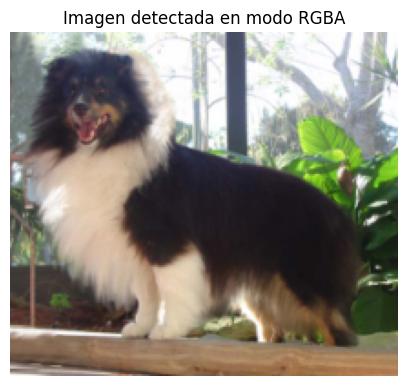

Ruta de la imagen: /content/drive/MyDrive/proyecto_integrador/images/n02105855-Shetland_sheepdog/n02105855_2933.jpg
Modo: RGBA
Tamaño: (213, 189)


In [28]:
# Visualizamos la imagen RGBA detectada

rgba_image_path = df.loc[df["mode"] == "RGBA", "image_path"].iloc[0]

img = Image.open(rgba_image_path)

plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.axis("off")
plt.title("Imagen detectada en modo RGBA")
plt.show()

print("Ruta de la imagen:", rgba_image_path)
print("Modo:", img.mode)
print("Tamaño:", img.size)

## Estadísticas descriptivas de las imágenes

Las estadísticas descriptivas muestran que el dataset contiene imágenes con dimensiones variables. El ancho promedio es de aproximadamente 442.53 píxeles, mientras que la altura promedio es de 385.86 píxeles. La mediana del ancho es de 500 píxeles y la mediana de la altura es de 375 píxeles.

Se observa que existen imágenes pequeñas, con un ancho mínimo de 97 píxeles y una altura mínima de 100 píxeles. También hay imágenes considerablemente grandes, con un ancho máximo de 3264 píxeles y una altura máxima de 2562 píxeles. Esta variabilidad confirma la necesidad de redimensionar las imágenes antes de utilizarlas en un modelo de visión computacional.

Respecto a los canales, casi todas las imágenes tienen 3 canales, correspondientes al formato RGB. Sin embargo, se detectó una imagen con 4 canales, correspondiente al formato RGBA. Por esta razón, se recomienda convertir todas las imágenes a RGB durante el preprocesamiento.

El tamaño promedio de los archivos es de aproximadamente 36.90 KB. Sin embargo, existe una diferencia considerable entre el archivo más pequeño, de 2.94 KB, y el más grande, de 1097.59 KB. Esto puede indicar diferencias de resolución, compresión o calidad visual entre las imágenes.

In [30]:
# Creamos una variable de proporción ancho-alto

df["aspect_ratio"] = df["width"] / df["height"]

# Estadísticas descriptivas de la proporción
df["aspect_ratio"].describe()

,aspect_ratio
count,20580.000000
mean,1.187153
std,0.297824
min,0.393574
25%,0.926000
50%,1.333333
75%,1.337209
max,3.633588


In [31]:
# Revisamos las imágenes con proporciones más extremas

df[["image_path", "breed", "width", "height", "aspect_ratio"]].sort_values(
    by="aspect_ratio", ascending=False
).head(10)

,image_path,breed,width,height,aspect_ratio
20037,/content/drive/MyDrive/proyecto_integrador/ima...,dhole,476,131,3.633588
9640,/content/drive/MyDrive/proyecto_integrador/ima...,flat-coated retriever,700,250,2.800000
16823,/content/drive/MyDrive/proyecto_integrador/ima...,pug,500,192,2.604167
11982,/content/drive/MyDrive/proyecto_integrador/ima...,Sussex spaniel,640,250,2.560000
7908,/content/drive/MyDrive/proyecto_integrador/ima...,standard schnauzer,372,152,2.447368
4891,/content/drive/MyDrive/proyecto_integrador/ima...,Norwegian elkhound,500,211,2.369668
17835,/content/drive/MyDrive/proyecto_integrador/ima...,Great Pyrenees,500,212,2.358491
10717,/content/drive/MyDrive/proyecto_integrador/ima...,Irish setter,500,215,2.325581
17200,/content/drive/MyDrive/proyecto_integrador/ima...,Siberian husky,360,155,2.322581
17152,/content/drive/MyDrive/proyecto_integrador/ima...,Siberian husky,500,216,2.314815


In [32]:
# Revisamos imágenes muy verticales, es decir, con aspect ratio más bajo

df[["image_path", "breed", "width", "height", "aspect_ratio"]].sort_values(
    by="aspect_ratio", ascending=True
).head(10)

,image_path,breed,width,height,aspect_ratio
10409,/content/drive/MyDrive/proyecto_integrador/ima...,West Highland white terrier,196,498,0.393574
4909,/content/drive/MyDrive/proyecto_integrador/ima...,Norwegian elkhound,207,500,0.414000
4639,/content/drive/MyDrive/proyecto_integrador/ima...,Ibizan hound,200,476,0.420168
19816,/content/drive/MyDrive/proyecto_integrador/ima...,African hunting dog,274,650,0.421538
15549,/content/drive/MyDrive/proyecto_integrador/ima...,Great Dane,640,1511,0.423561
13590,/content/drive/MyDrive/proyecto_integrador/ima...,komondor,218,500,0.436000
3169,/content/drive/MyDrive/proyecto_integrador/ima...,Rhodesian ridgeback,158,346,0.456647
20243,/content/drive/MyDrive/proyecto_integrador/ima...,miniature poodle,234,500,0.468000
5114,/content/drive/MyDrive/proyecto_integrador/ima...,Scottish deerhound,234,500,0.468000
5827,/content/drive/MyDrive/proyecto_integrador/ima...,Irish terrier,235,500,0.470000


## Análisis de la proporción ancho-alto

Se creó la variable `aspect_ratio`, calculada como el ancho dividido entre la altura de cada imagen. Esta variable permite analizar la forma general de las imágenes y detectar casos con proporciones extremas.

El valor promedio de `aspect_ratio` fue de 1.187, lo que indica que, en general, las imágenes son ligeramente más anchas que altas. La mediana fue de 1.333, cercana a una proporción 4:3, común en imágenes digitales.

Sin embargo, también se detectaron valores extremos. El valor mínimo fue de 0.394, correspondiente a una imagen muy vertical, mientras que el valor máximo fue de 3.634, correspondiente a una imagen muy horizontal. Estos casos no necesariamente son errores, pero deben revisarse visualmente porque al redimensionar todas las imágenes a un tamaño fijo podrían sufrir deformación o pérdida de información relevante.

Por esta razón, para el preprocesamiento se recomienda usar estrategias como redimensionamiento controlado, recorte centrado, padding o transformaciones estándar de modelos preentrenados.

## Visualización de distribuciones numéricas

A continuación se visualizan las distribuciones de las principales variables numéricas del dataset: ancho, alto, proporción ancho-alto y tamaño del archivo. Esto permite identificar sesgos, concentración de valores y posibles valores atípicos.

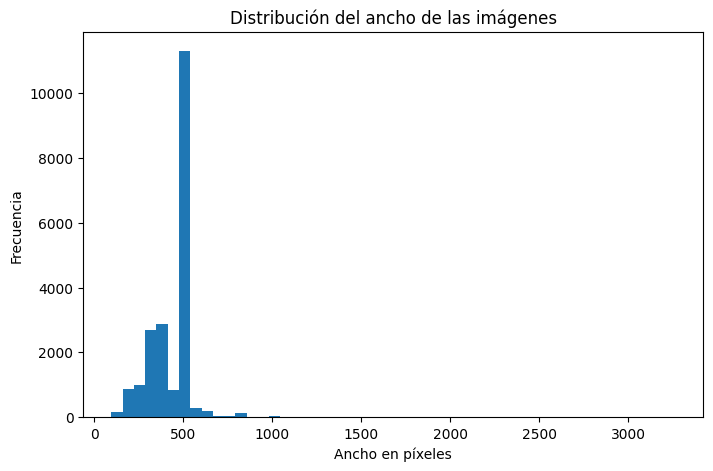

In [33]:
# Histograma del ancho de las imágenes

plt.figure(figsize=(8, 5))
plt.hist(df["width"], bins=50)
plt.title("Distribución del ancho de las imágenes")
plt.xlabel("Ancho en píxeles")
plt.ylabel("Frecuencia")
plt.show()

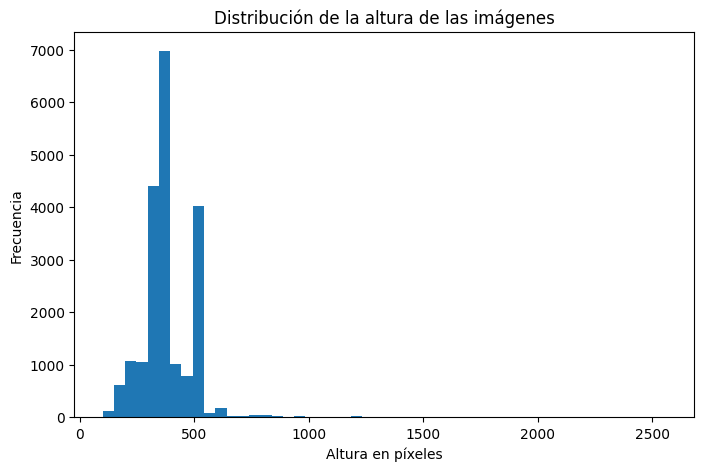

In [34]:
# Histograma de la altura de las imágenes

plt.figure(figsize=(8, 5))
plt.hist(df["height"], bins=50)
plt.title("Distribución de la altura de las imágenes")
plt.xlabel("Altura en píxeles")
plt.ylabel("Frecuencia")
plt.show()

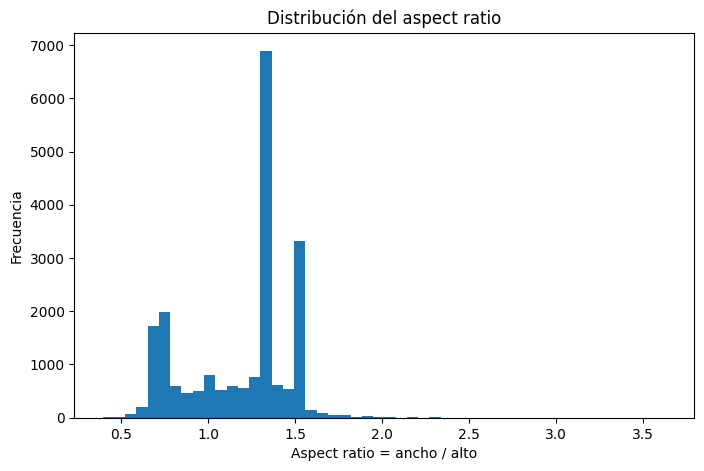

In [35]:
# Histograma de la proporción ancho-alto

plt.figure(figsize=(8, 5))
plt.hist(df["aspect_ratio"], bins=50)
plt.title("Distribución del aspect ratio")
plt.xlabel("Aspect ratio = ancho / alto")
plt.ylabel("Frecuencia")
plt.show()

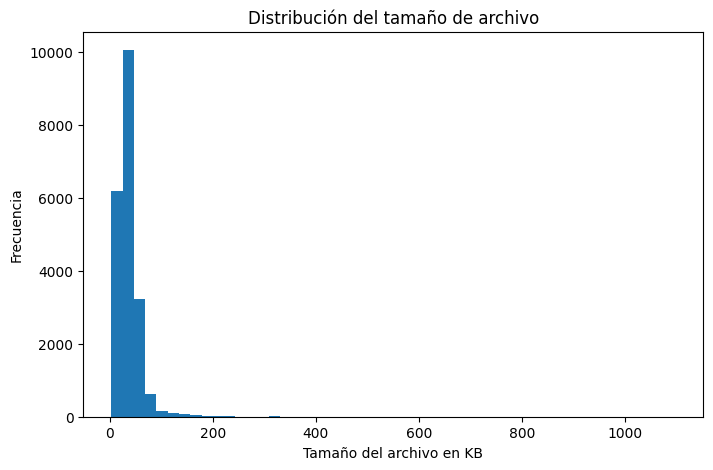

In [36]:
# Histograma del tamaño de archivo

plt.figure(figsize=(8, 5))
plt.hist(df["file_size_kb"], bins=50)
plt.title("Distribución del tamaño de archivo")
plt.xlabel("Tamaño del archivo en KB")
plt.ylabel("Frecuencia")
plt.show()

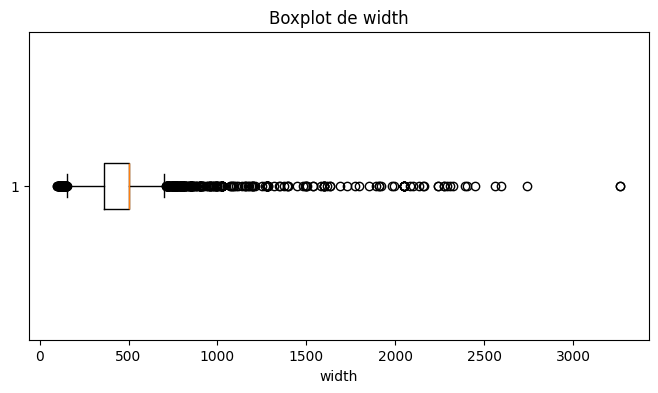

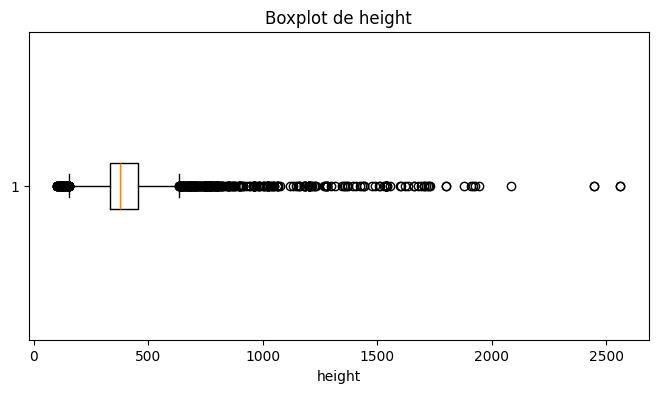

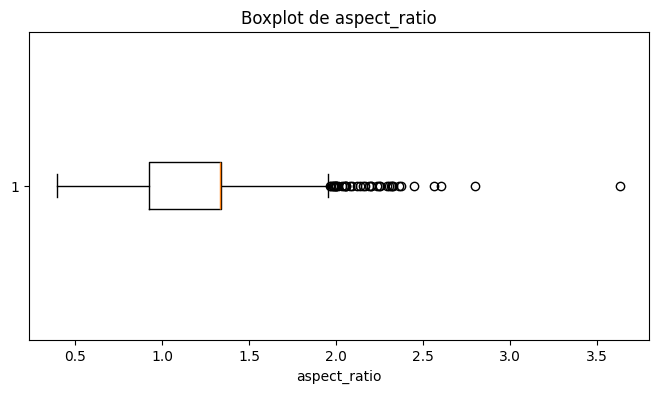

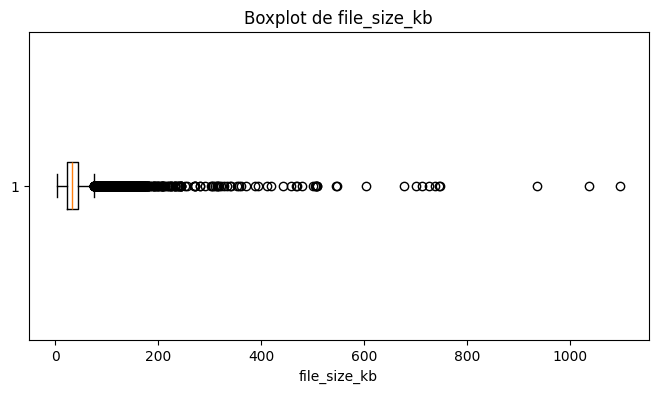

In [37]:
# Boxplots para detectar posibles valores atípicos

numeric_cols = ["width", "height", "aspect_ratio", "file_size_kb"]

for col in numeric_cols:
    plt.figure(figsize=(8, 4))
    plt.boxplot(df[col].dropna(), vert=False)
    plt.title(f"Boxplot de {col}")
    plt.xlabel(col)
    plt.show()

## Análisis de distribuciones y valores atípicos

Las distribuciones de ancho y altura muestran que la mayoría de las imágenes se concentran en resoluciones relativamente comunes. En particular, muchas imágenes tienen un ancho cercano a 500 píxeles y una altura entre 300 y 500 píxeles. Esto sugiere que una parte importante del dataset ya se encuentra en tamaños moderados para tareas de visión computacional.

Sin embargo, los boxplots muestran la presencia de valores atípicos en las variables `width` y `height`. Existen imágenes con dimensiones considerablemente mayores al rango principal, incluyendo anchos superiores a 1000, 2000 e incluso 3000 píxeles, así como alturas superiores a 1000 o 2000 píxeles. Estos casos no necesariamente representan errores, pero sí reflejan variabilidad importante en la resolución de las imágenes.

La variable `aspect_ratio` también presenta valores atípicos. La mayoría de las imágenes se concentra entre proporciones aproximadas de 0.75 y 1.5, pero se detectan imágenes muy horizontales con valores superiores a 2.0 y un máximo cercano a 3.63. También existen imágenes muy verticales con valores cercanos a 0.39. Estas proporciones extremas pueden afectar el redimensionamiento, ya que una transformación directa a un tamaño fijo podría deformar visualmente al perro.

Por último, el tamaño de archivo presenta una distribución sesgada hacia la derecha. La mayoría de las imágenes tiene un tamaño relativamente bajo, pero existen algunos archivos mucho más grandes. Esta diferencia puede estar relacionada con la resolución, el nivel de compresión o la calidad de imagen.

En conclusión, se identifican valores atípicos en dimensiones, proporción y tamaño de archivo. No se recomienda eliminarlos automáticamente, ya que pueden ser imágenes válidas. En su lugar, se recomienda revisar visualmente los casos extremos y aplicar un preprocesamiento adecuado, como conversión a RGB, redimensionamiento, normalización y, si es necesario, padding o recorte controlado.

In [44]:
# Función para detectar valores atípicos usando el criterio IQR

def detect_outliers_iqr(dataframe, column):
    Q1 = dataframe[column].quantile(0.25)
    Q3 = dataframe[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR

    outliers = dataframe[
        (dataframe[column] < lower_limit) |
        (dataframe[column] > upper_limit)
    ]

    return lower_limit, upper_limit, outliers

# Aplicamos detección de outliers a variables numéricas principales
outlier_summary = []

for col in ["width", "height", "aspect_ratio", "file_size_kb"]:
    lower, upper, outliers = detect_outliers_iqr(df, col)

    outlier_summary.append({
        "variable": col,
        "lower_limit": lower,
        "upper_limit": upper,
        "num_outliers": len(outliers),
        "percent_outliers": round((len(outliers) / len(df)) * 100, 2)
    })

outlier_summary_df = pd.DataFrame(outlier_summary)
outlier_summary_df

,variable,lower_limit,upper_limit,num_outliers,percent_outliers
0,width,152.500000,708.500000,472,2.29
1,height,153.000000,633.000000,533,2.59
2,aspect_ratio,0.309186,1.954023,39,0.19
3,file_size_kb,-8.773926,75.536621,758,3.68


In [39]:
# Revisamos algunas imágenes con mayor aspect ratio, es decir, más horizontales

df[["image_path", "breed", "width", "height", "aspect_ratio", "file_size_kb"]].sort_values(
    by="aspect_ratio", ascending=False
).head(10)

,image_path,breed,width,height,aspect_ratio,file_size_kb
20037,/content/drive/MyDrive/proyecto_integrador/ima...,dhole,476,131,3.633588,27.052734
9640,/content/drive/MyDrive/proyecto_integrador/ima...,flat-coated retriever,700,250,2.800000,24.891602
16823,/content/drive/MyDrive/proyecto_integrador/ima...,pug,500,192,2.604167,26.473633
11982,/content/drive/MyDrive/proyecto_integrador/ima...,Sussex spaniel,640,250,2.560000,15.661133
7908,/content/drive/MyDrive/proyecto_integrador/ima...,standard schnauzer,372,152,2.447368,14.769531
4891,/content/drive/MyDrive/proyecto_integrador/ima...,Norwegian elkhound,500,211,2.369668,33.654297
17835,/content/drive/MyDrive/proyecto_integrador/ima...,Great Pyrenees,500,212,2.358491,27.455078
10717,/content/drive/MyDrive/proyecto_integrador/ima...,Irish setter,500,215,2.325581,23.949219
17200,/content/drive/MyDrive/proyecto_integrador/ima...,Siberian husky,360,155,2.322581,13.805664
17152,/content/drive/MyDrive/proyecto_integrador/ima...,Siberian husky,500,216,2.314815,22.026367


In [40]:
# Revisamos algunas imágenes con menor aspect ratio, es decir, más verticales

df[["image_path", "breed", "width", "height", "aspect_ratio", "file_size_kb"]].sort_values(
    by="aspect_ratio", ascending=True
).head(10)

,image_path,breed,width,height,aspect_ratio,file_size_kb
10409,/content/drive/MyDrive/proyecto_integrador/ima...,West Highland white terrier,196,498,0.393574,16.146484
4909,/content/drive/MyDrive/proyecto_integrador/ima...,Norwegian elkhound,207,500,0.414000,16.111328
4639,/content/drive/MyDrive/proyecto_integrador/ima...,Ibizan hound,200,476,0.420168,24.574219
19816,/content/drive/MyDrive/proyecto_integrador/ima...,African hunting dog,274,650,0.421538,29.359375
15549,/content/drive/MyDrive/proyecto_integrador/ima...,Great Dane,640,1511,0.423561,62.383789
13590,/content/drive/MyDrive/proyecto_integrador/ima...,komondor,218,500,0.436000,21.224609
3169,/content/drive/MyDrive/proyecto_integrador/ima...,Rhodesian ridgeback,158,346,0.456647,11.771484
20243,/content/drive/MyDrive/proyecto_integrador/ima...,miniature poodle,234,500,0.468000,19.786133
5114,/content/drive/MyDrive/proyecto_integrador/ima...,Scottish deerhound,234,500,0.468000,19.945312
5827,/content/drive/MyDrive/proyecto_integrador/ima...,Irish terrier,235,500,0.470000,22.756836


## Detección formal de valores atípicos con IQR

Para complementar la inspección visual de los boxplots, se aplicó el criterio del rango intercuartílico, conocido como IQR. Este método define como posibles valores atípicos aquellos registros que se encuentran por debajo de `Q1 - 1.5 * IQR` o por encima de `Q3 + 1.5 * IQR`.

Los resultados muestran que la variable `width` tiene 472 valores atípicos, equivalentes al 2.29% del dataset. La variable `height` presenta 533 valores atípicos, equivalentes al 2.59%. En el caso de `aspect_ratio`, se detectaron 39 valores atípicos, lo que representa únicamente el 0.19% del total. Finalmente, `file_size_kb` presenta 758 valores atípicos, equivalentes al 3.68%.

Estos porcentajes son relativamente bajos, por lo que no se recomienda eliminar automáticamente estas imágenes. En datasets de visión computacional, una imagen con resolución grande, peso alto o proporción diferente puede seguir siendo válida y contener información útil para el modelo. Por esta razón, la decisión más adecuada es conservar las imágenes, revisar visualmente los casos extremos y aplicar un preprocesamiento uniforme antes del entrenamiento.

In [41]:
# Función para visualizar una muestra de imágenes a partir de un DataFrame

def show_image_sample(sample_df, title, n=6):
    sample_df = sample_df.head(n)

    plt.figure(figsize=(15, 8))

    for i, (_, row) in enumerate(sample_df.iterrows(), 1):
        img = Image.open(row["image_path"]).convert("RGB")

        plt.subplot(2, 3, i)
        plt.imshow(img)
        plt.axis("off")
        plt.title(
            f'{row["breed"]}\n{row["width"]}x{row["height"]}\nAR={row["aspect_ratio"]:.2f}',
            fontsize=9
        )

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

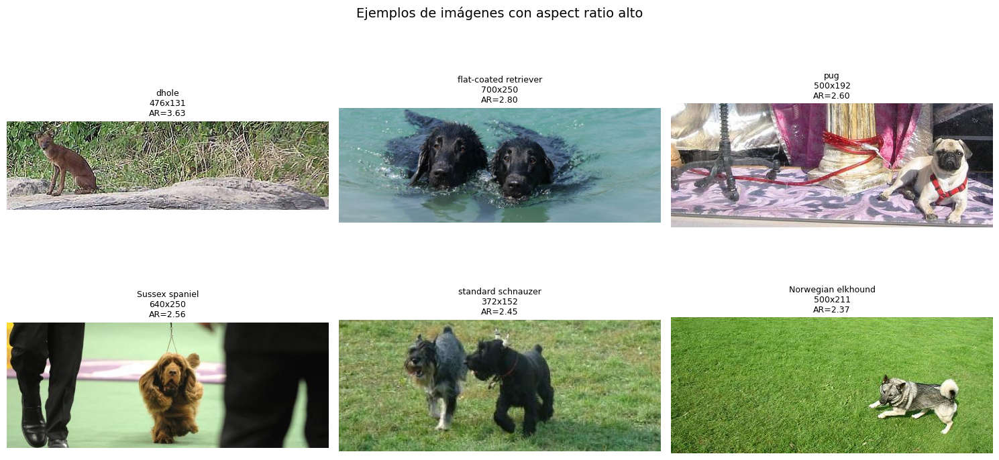

In [43]:
# Visualizamos imágenes más horizontales

horizontal_images = df.sort_values(by="aspect_ratio", ascending=False)

show_image_sample(
    horizontal_images,
    "Ejemplos de imágenes con aspect ratio alto"
)

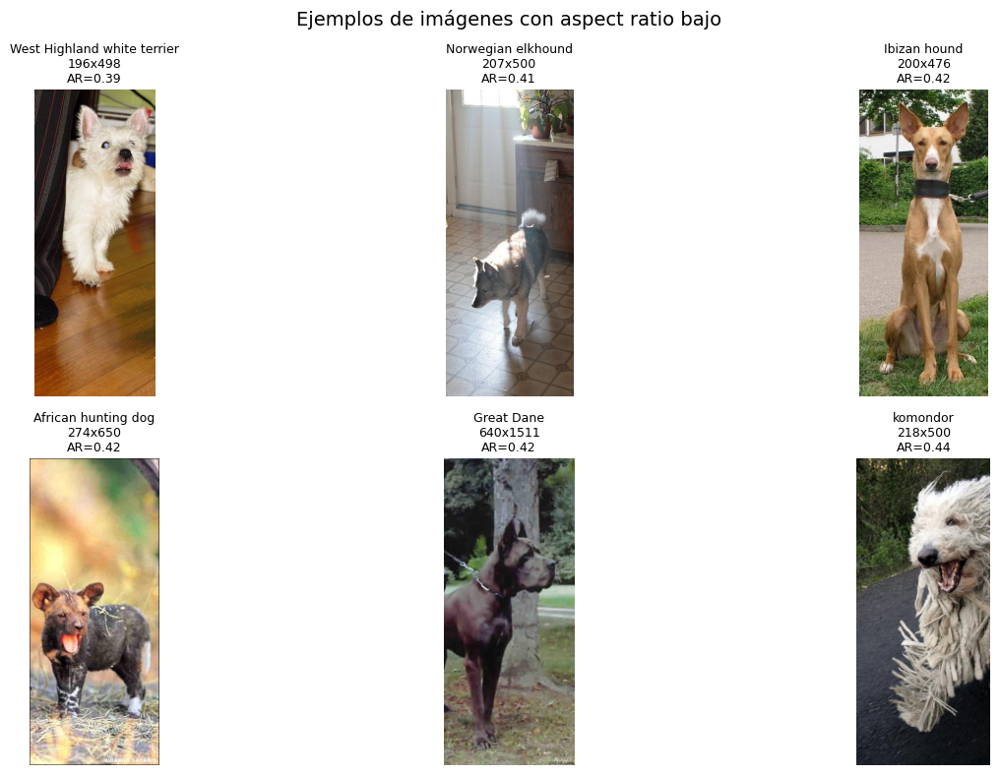

In [45]:
# Visualizamos imágenes más verticales

vertical_images = df.sort_values(by="aspect_ratio", ascending=True)

show_image_sample(
    vertical_images,
    "Ejemplos de imágenes con aspect ratio bajo"
)

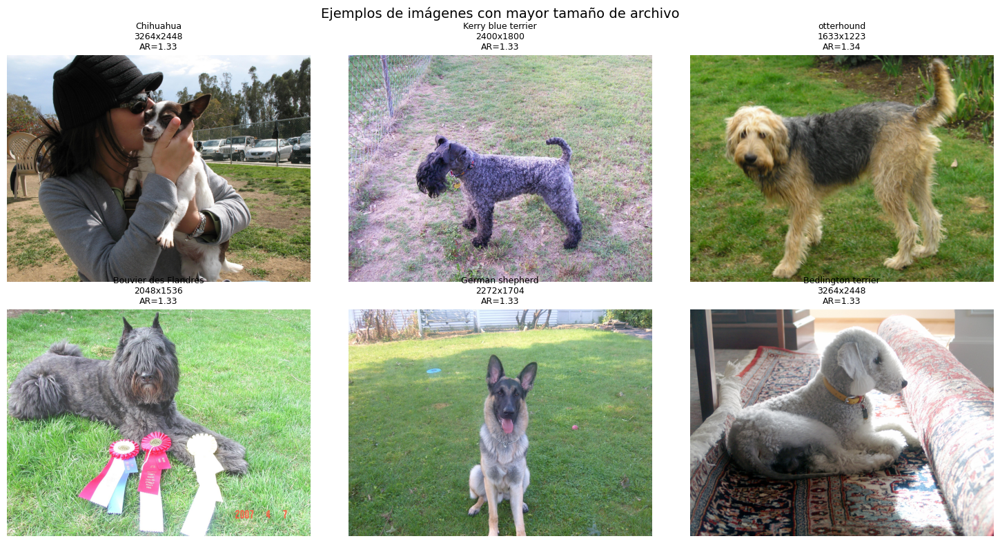

In [46]:
# Visualizamos imágenes con mayor tamaño de archivo

large_file_images = df.sort_values(by="file_size_kb", ascending=False)

show_image_sample(
    large_file_images,
    "Ejemplos de imágenes con mayor tamaño de archivo"
)

## Revisión visual de valores atípicos

Después de identificar valores atípicos en dimensiones, proporción ancho-alto y tamaño de archivo, se realizó una inspección visual de algunos ejemplos extremos.

Las imágenes con `aspect_ratio` alto corresponden a fotografías muy horizontales. Aunque su proporción es atípica, las imágenes contienen perros y parecen ser registros válidos. De forma similar, las imágenes con `aspect_ratio` bajo corresponden a fotografías muy verticales, pero también muestran perros de manera clara.

En el caso de las imágenes con mayor tamaño de archivo, se observa que corresponden principalmente a imágenes de mayor resolución o calidad, no a archivos corruptos. Por lo tanto, estos valores atípicos no deben eliminarse automáticamente.

También se identifican características propias de datasets reales de imágenes, como fondos complejos, perros pequeños dentro de la escena, presencia de más de un perro, variaciones de iluminación y perros parcialmente recortados. Estas condiciones pueden aumentar la dificultad del modelo, pero también ayudan a que el modelo aprenda con datos más diversos.

La decisión de preprocesamiento será conservar estas imágenes y aplicar transformaciones uniformes como conversión a RGB, redimensionamiento, normalización y posiblemente técnicas de aumento de datos.

## Distribución de clases

En esta sección se analiza la distribución de imágenes por raza.  
Este análisis permite identificar si el dataset está balanceado o si existen razas con muchas más imágenes que otras.

El balance de clases es importante porque, si algunas razas tienen más ejemplos que otras, el modelo podría aprender mejor las clases mayoritarias y tener peor desempeño en las clases con menos imágenes.

In [47]:
# Contamos imágenes por raza

breed_counts = df["breed"].value_counts()

breed_counts

,count
breed,
Maltese dog,252
Afghan hound,239
Scottish deerhound,232
Pomeranian,219
Bernese mountain dog,218
...,...
malinois,150
Eskimo dog,150
dhole,150


In [48]:
# Estadísticas descriptivas del número de imágenes por raza

breed_counts.describe()

,count
count,120.000000
mean,171.500000
std,23.220898
min,148.000000
25%,152.750000
50%,159.500000
75%,186.250000
max,252.000000


In [49]:
# Mostramos las 10 razas con más imágenes

breed_counts.head(10)

,count
breed,
Maltese dog,252
Afghan hound,239
Scottish deerhound,232
Pomeranian,219
Bernese mountain dog,218
Samoyed,218
Irish wolfhound,218
Shih-Tzu,214
Great Pyrenees,213


In [50]:
# Mostramos las 10 razas con menos imágenes

breed_counts.tail(10)

,count
breed,
Welsh springer spaniel,150
Irish water spaniel,150
affenpinscher,150
Doberman,150
groenendael,150
malinois,150
Eskimo dog,150
dhole,150
Pekinese,149


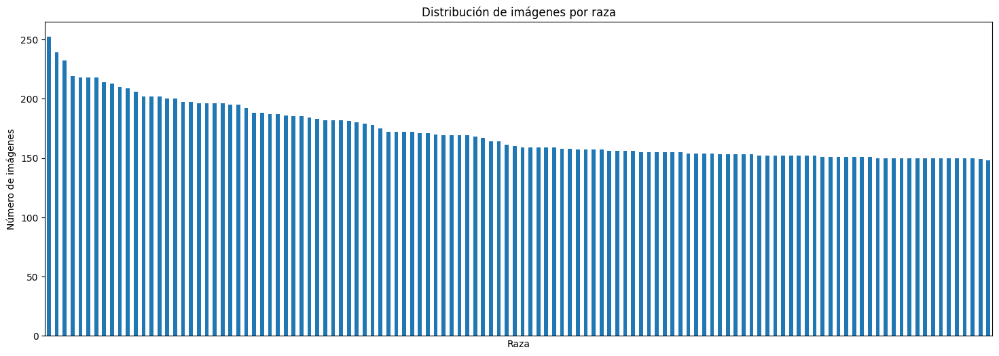

In [51]:
# Gráfico de distribución de imágenes por raza

plt.figure(figsize=(18, 6))
breed_counts.plot(kind="bar")
plt.title("Distribución de imágenes por raza")
plt.xlabel("Raza")
plt.ylabel("Número de imágenes")
plt.xticks([])
plt.show()

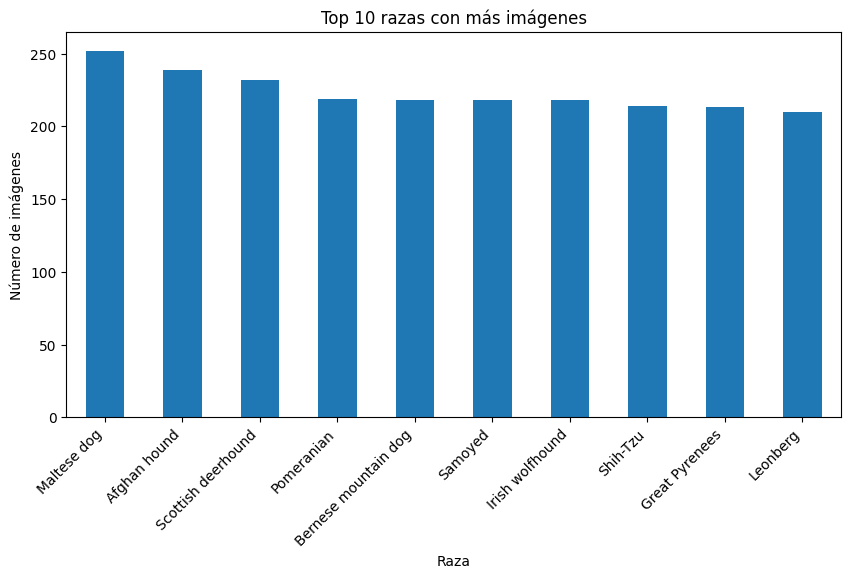

In [52]:
# Top 10 razas con más imágenes

plt.figure(figsize=(10, 5))
breed_counts.head(10).plot(kind="bar")
plt.title("Top 10 razas con más imágenes")
plt.xlabel("Raza")
plt.ylabel("Número de imágenes")
plt.xticks(rotation=45, ha="right")
plt.show()

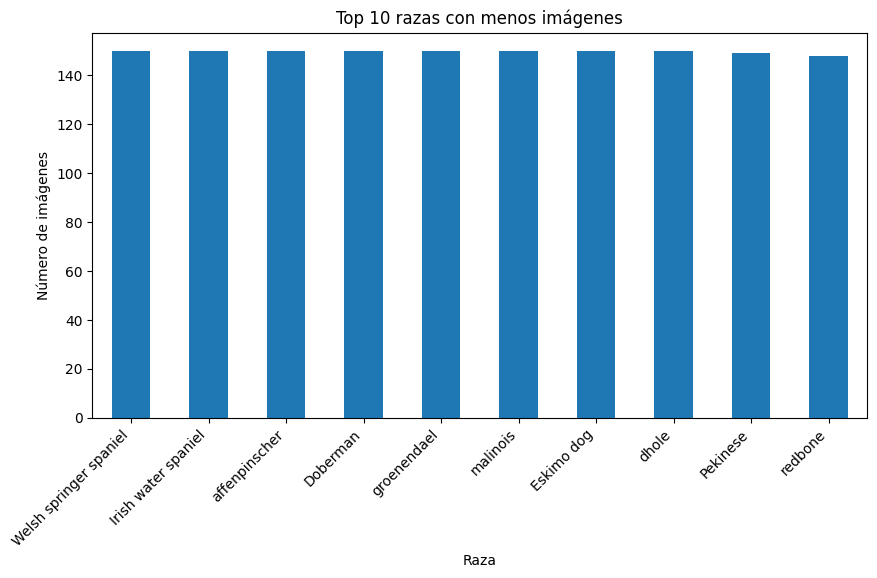

In [53]:
# Top 10 razas con menos imágenes

plt.figure(figsize=(10, 5))
breed_counts.tail(10).plot(kind="bar")
plt.title("Top 10 razas con menos imágenes")
plt.xlabel("Raza")
plt.ylabel("Número de imágenes")
plt.xticks(rotation=45, ha="right")
plt.show()

## Análisis de balance de clases

El dataset contiene 120 razas de perros, lo que confirma una alta cardinalidad en la variable objetivo. En promedio, cada raza tiene aproximadamente 171.5 imágenes. Sin embargo, la cantidad de imágenes por raza no es exactamente igual.

La raza con mayor número de imágenes es `Maltese dog`, con 252 imágenes, mientras que la raza con menor número de imágenes es `redbone`, con 148 imágenes. Esto representa una diferencia de 104 imágenes entre la clase mayoritaria y la clase minoritaria.

La razón entre la clase mayoritaria y la clase minoritaria es aproximadamente 1.7. Esto indica que el dataset está relativamente balanceado, ya que no existe una diferencia extrema entre clases. Sin embargo, el modelo podría beneficiarse de técnicas como `data augmentation` para aumentar la diversidad visual durante el entrenamiento, especialmente en clases con menos ejemplos.

No se recomienda eliminar clases, ya que las 120 razas forman parte del objetivo principal del problema de clasificación multiclase.

In [54]:
# Cálculo formal de diferencia y razón entre clase mayoritaria y minoritaria

max_class_count = breed_counts.max()
min_class_count = breed_counts.min()

max_class_name = breed_counts.idxmax()
min_class_name = breed_counts.idxmin()

difference = max_class_count - min_class_count
imbalance_ratio = max_class_count / min_class_count

print("Clase con más imágenes:", max_class_name, "-", max_class_count)
print("Clase con menos imágenes:", min_class_name, "-", min_class_count)
print("Diferencia:", difference)
print("Razón de desbalance:", round(imbalance_ratio, 2))

Clase con más imágenes: Maltese dog - 252
Clase con menos imágenes: redbone - 148
Diferencia: 104
Razón de desbalance: 1.7


## Análisis bivariado

En esta sección se analizan relaciones entre variables del dataset.  
Aunque el Stanford Dogs Dataset no contiene variables tabulares tradicionales, sí es posible estudiar relaciones entre la raza del perro y características de las imágenes, como ancho, alto, proporción ancho-alto y tamaño de archivo.

Este análisis permite identificar si ciertas razas tienen imágenes con dimensiones más grandes, más pequeñas o proporciones particulares.

In [55]:
# Resumen estadístico por raza

breed_stats = df.groupby("breed").agg(
    num_images=("image_path", "count"),
    mean_width=("width", "mean"),
    mean_height=("height", "mean"),
    mean_aspect_ratio=("aspect_ratio", "mean"),
    mean_file_size_kb=("file_size_kb", "mean")
).sort_values(by="num_images", ascending=False)

breed_stats.head()

,num_images,mean_width,mean_height,mean_aspect_ratio,mean_file_size_kb
breed,,,,,
Maltese dog,252,464.305556,389.134921,1.228792,27.768365
Afghan hound,239,424.757322,443.857741,1.002296,42.685539
Scottish deerhound,232,456.353448,413.379310,1.141696,41.475140
Pomeranian,219,457.173516,400.497717,1.185632,31.288255
Irish wolfhound,218,455.417431,387.724771,1.225319,39.351737


In [56]:
# Razas con mayor ancho promedio

breed_stats.sort_values(by="mean_width", ascending=False).head(10)

,num_images,mean_width,mean_height,mean_aspect_ratio,mean_file_size_kb
breed,,,,,
Sussex spaniel,151,532.092715,464.894040,1.177787,46.020488
Great Dane,156,521.878205,524.211538,1.061507,51.888547
keeshond,158,482.753165,379.658228,1.301969,37.417239
basset,175,478.960000,396.720000,1.240287,36.720541
Cardigan,155,476.200000,371.554839,1.302722,40.685244
Great Pyrenees,213,475.262911,377.619718,1.290861,35.389818
golden retriever,150,473.293333,401.006667,1.214900,36.790228
dhole,150,472.546667,355.753333,1.356732,40.075352
beagle,195,471.056410,388.364103,1.243971,35.017864


In [57]:
# Razas con menor ancho promedio

breed_stats.sort_values(by="mean_width", ascending=True).head(10)

,num_images,mean_width,mean_height,mean_aspect_ratio,mean_file_size_kb
breed,,,,,
wire-haired fox terrier,157,327.522293,305.885350,1.108861,22.011470
English foxhound,157,337.382166,301.114650,1.149383,48.756077
otterhound,151,342.205298,313.794702,1.130078,49.158016
black-and-tan coonhound,159,351.125786,322.000000,1.119798,24.875295
affenpinscher,150,352.553333,325.560000,1.115126,23.453867
Sealyham terrier,202,367.534653,301.173267,1.249883,21.144686
Japanese spaniel,185,370.129730,333.172973,1.126891,24.843750
Mexican hairless,155,376.387097,372.129032,1.049027,30.548003
Brabancon griffon,153,380.248366,358.581699,1.101206,32.140523


In [58]:
# Razas con mayor altura promedio

breed_stats.sort_values(by="mean_height", ascending=False).head(10)

,num_images,mean_width,mean_height,mean_aspect_ratio,mean_file_size_kb
breed,,,,,
Great Dane,156,521.878205,524.211538,1.061507,51.888547
Sussex spaniel,151,532.092715,464.894040,1.177787,46.020488
Afghan hound,239,424.757322,443.857741,1.002296,42.685539
Irish water spaniel,150,450.253333,424.833333,1.064549,46.534212
Greater Swiss Mountain dog,168,430.815476,420.214286,1.079848,34.258609
Saint Bernard,170,458.429412,416.458824,1.128651,36.191280
Scottish deerhound,232,456.353448,413.379310,1.141696,41.475140
Doberman,150,445.346667,412.880000,1.110929,42.024251
silky terrier,183,450.038251,411.147541,1.141342,40.939320


In [59]:
# Razas con mayor aspect ratio promedio

breed_stats.sort_values(by="mean_aspect_ratio", ascending=False).head(10)

,num_images,mean_width,mean_height,mean_aspect_ratio,mean_file_size_kb
breed,,,,,
dhole,150,472.546667,355.753333,1.356732,40.075352
African hunting dog,169,463.952663,354.781065,1.329240,39.294257
Cardigan,155,476.200000,371.554839,1.302722,40.685244
keeshond,158,482.753165,379.658228,1.301969,37.417239
Great Pyrenees,213,475.262911,377.619718,1.290861,35.389818
Saluki,200,468.135000,378.705000,1.275553,35.714360
Samoyed,218,468.706422,376.027523,1.273680,31.446692
dingo,156,449.365385,364.051282,1.272880,40.643292
whippet,187,463.411765,380.534759,1.268283,38.007301


In [60]:
# Razas con mayor aspect ratio promedio

breed_stats.sort_values(by="mean_aspect_ratio", ascending=False).head(10)

,num_images,mean_width,mean_height,mean_aspect_ratio,mean_file_size_kb
breed,,,,,
dhole,150,472.546667,355.753333,1.356732,40.075352
African hunting dog,169,463.952663,354.781065,1.329240,39.294257
Cardigan,155,476.200000,371.554839,1.302722,40.685244
keeshond,158,482.753165,379.658228,1.301969,37.417239
Great Pyrenees,213,475.262911,377.619718,1.290861,35.389818
Saluki,200,468.135000,378.705000,1.275553,35.714360
Samoyed,218,468.706422,376.027523,1.273680,31.446692
dingo,156,449.365385,364.051282,1.272880,40.643292
whippet,187,463.411765,380.534759,1.268283,38.007301


<Figure size 1400x600 with 0 Axes>

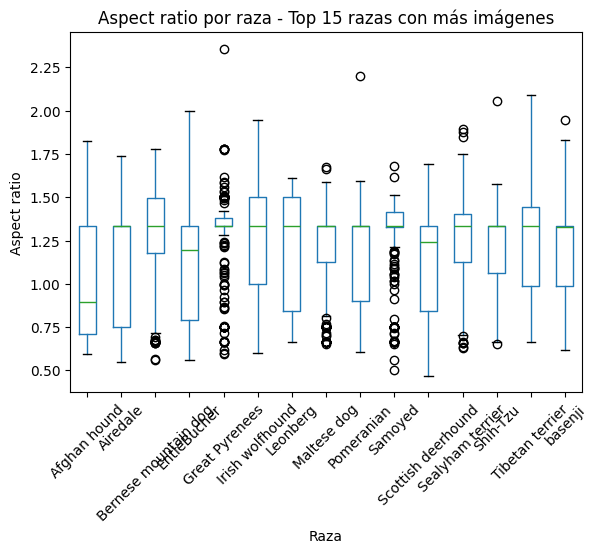

In [61]:
# Boxplot de aspect ratio por raza
# Se muestran solo las 15 razas con más imágenes para mantener legible la gráfica

top_15_breeds = breed_counts.head(15).index

plt.figure(figsize=(14, 6))
df[df["breed"].isin(top_15_breeds)].boxplot(
    column="aspect_ratio",
    by="breed",
    rot=45,
    grid=False
)

plt.title("Aspect ratio por raza - Top 15 razas con más imágenes")
plt.suptitle("")
plt.xlabel("Raza")
plt.ylabel("Aspect ratio")
plt.show()

## Interpretación del análisis bivariado

El análisis bivariado permitió comparar la raza del perro con características de las imágenes, como ancho, alto, proporción ancho-alto y tamaño de archivo.

Al revisar el `aspect_ratio` promedio por raza, se observa que algunas clases, como `dhole`, `African hunting dog`, `Cardigan`, `keeshond` y `Great Pyrenees`, presentan imágenes ligeramente más horizontales en promedio. Por ejemplo, la raza `dhole` tiene un aspect ratio promedio de 1.36, lo que indica que sus imágenes tienden a ser más anchas que altas.

Este resultado no debe interpretarse como una característica física directa de la raza, sino como una característica del conjunto de imágenes disponible. Las diferencias pueden deberse al encuadre de la fotografía, la postura del perro, la distancia de la cámara, el fondo o la forma en que se capturó la imagen.

Este hallazgo es importante porque confirma que las imágenes no tienen una proporción uniforme entre razas. Por ello, durante el preprocesamiento se debe evitar una deformación excesiva al redimensionar las imágenes. Una alternativa adecuada es redimensionar manteniendo proporción, aplicar padding o usar transformaciones estándar compatibles con modelos de visión computacional.

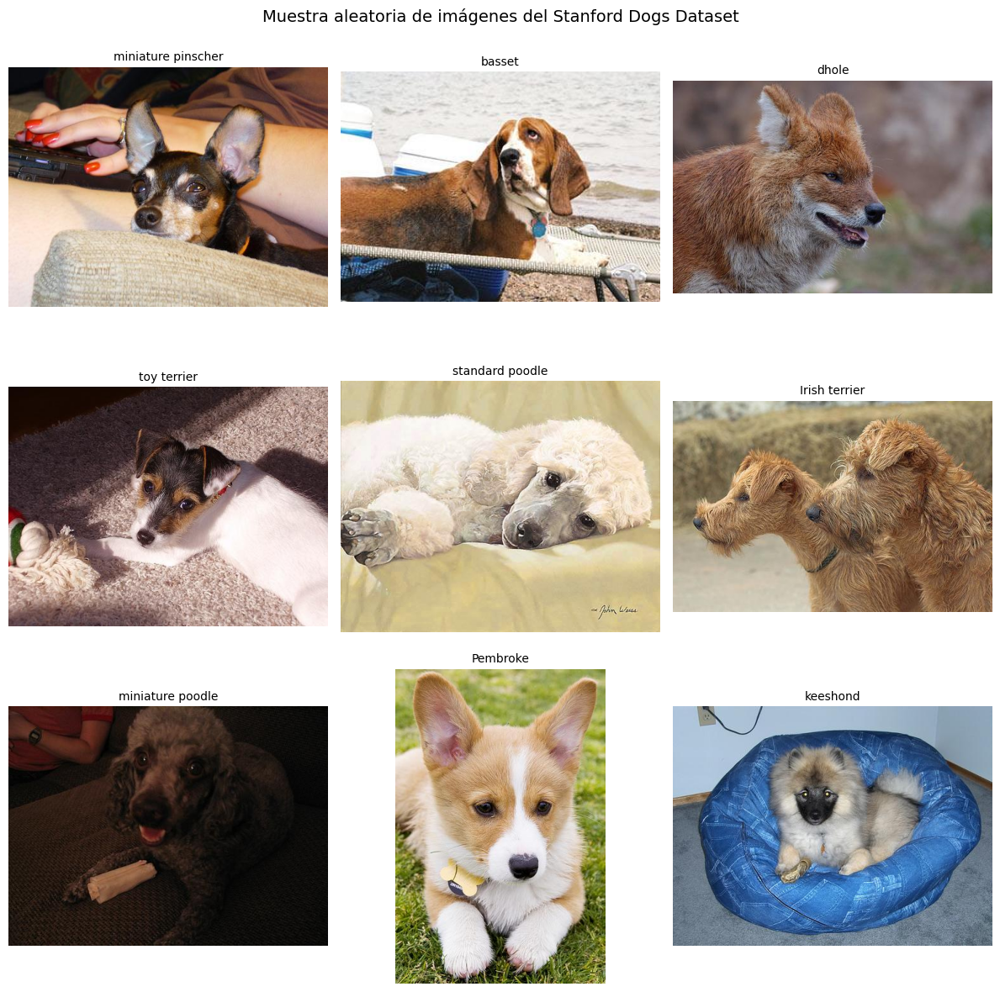

In [62]:
# Visualizamos imágenes aleatorias del dataset

sample_images = df.sample(9, random_state=42)

plt.figure(figsize=(12, 12))

for i, (_, row) in enumerate(sample_images.iterrows(), 1):
    img = Image.open(row["image_path"]).convert("RGB")

    plt.subplot(3, 3, i)
    plt.imshow(img)
    plt.axis("off")
    plt.title(row["breed"], fontsize=10)

plt.suptitle("Muestra aleatoria de imágenes del Stanford Dogs Dataset", fontsize=14)
plt.tight_layout()
plt.show()

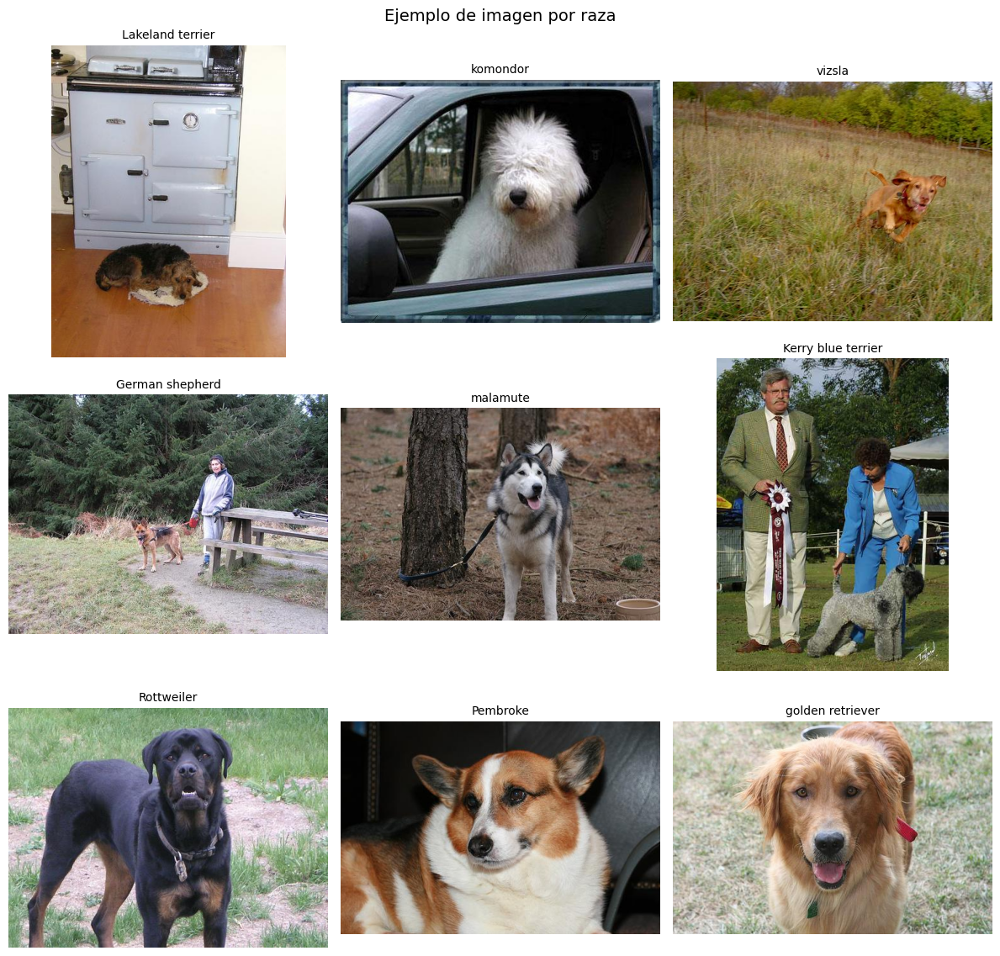

In [63]:
# Visualizamos una imagen aleatoria por algunas razas

selected_breeds = df["breed"].drop_duplicates().sample(9, random_state=10)

plt.figure(figsize=(12, 12))

for i, breed in enumerate(selected_breeds, 1):
    row = df[df["breed"] == breed].sample(1, random_state=10).iloc[0]
    img = Image.open(row["image_path"]).convert("RGB")

    plt.subplot(3, 3, i)
    plt.imshow(img)
    plt.axis("off")
    plt.title(breed, fontsize=10)

plt.suptitle("Ejemplo de imagen por raza", fontsize=14)
plt.tight_layout()
plt.show()

## Interpretación de la muestra visual

La visualización de imágenes aleatorias muestra que el dataset contiene una alta diversidad visual. Se observan diferencias en fondos, iluminación, posición del perro, distancia de la cámara, tamaño del perro dentro de la imagen y orientación de la fotografía.

Algunas imágenes presentan al perro claramente centrado, mientras que otras contienen fondos complejos, personas, objetos, pasto, interiores o más de un perro. También existen imágenes donde el perro ocupa una pequeña parte de la escena o aparece parcialmente recortado.

Esta variabilidad representa un reto para el modelo, ya que no solo debe aprender características generales de un perro, sino diferencias finas entre razas. Por esta razón, es recomendable utilizar modelos de visión computacional capaces de extraer patrones complejos, como redes neuronales convolucionales o modelos preentrenados.

## Preprocesamiento propuesto

Con base en los resultados del EDA, se proponen las siguientes operaciones de preprocesamiento antes de entrenar un modelo de visión computacional:

1. **Validación de imágenes**  
   Aunque no se detectaron imágenes corruptas ni faltantes, es recomendable mantener una validación automática al cargar el dataset para evitar errores durante el entrenamiento.

2. **Conversión a RGB**  
   Se detectó una imagen en formato RGBA, mientras que el resto se encuentra en RGB. Para asegurar consistencia, todas las imágenes deben convertirse a RGB.

3. **Redimensionamiento**  
   Las imágenes presentan diferentes dimensiones, con anchos desde 97 hasta 3264 píxeles y alturas desde 100 hasta 2562 píxeles. Por ello, es necesario redimensionarlas a un tamaño uniforme, por ejemplo `224x224`, que es común en modelos preentrenados como ResNet, EfficientNet o Vision Transformers.

4. **Manejo de proporciones**  
   Debido a que existen imágenes muy horizontales y muy verticales, se recomienda evitar deformaciones excesivas. Una estrategia adecuada puede ser redimensionar manteniendo la proporción y aplicar padding, o bien utilizar recortes controlados.

5. **Normalización de píxeles**  
   Los valores de los píxeles deben escalarse de `[0, 255]` a `[0, 1]`, o normalizarse usando media y desviación estándar si se emplea un modelo preentrenado.

6. **Data augmentation**  
   Aunque el dataset está relativamente balanceado, contiene alta variabilidad visual. Se recomienda aplicar aumento de datos únicamente en el conjunto de entrenamiento mediante transformaciones como rotaciones leves, volteo horizontal, cambios de brillo, recortes aleatorios y zoom moderado.

7. **Separación de datos**  
   Para evitar fuga de información, las transformaciones de entrenamiento deben aplicarse solo al conjunto de entrenamiento. El conjunto de validación o prueba debe conservar transformaciones determinísticas, como redimensionamiento y normalización.

In [64]:
# Ejemplo de preprocesamiento de una imagen

example_path = df["image_path"].iloc[0]

img = Image.open(example_path).convert("RGB")
img_resized = img.resize((224, 224))

img_array = np.array(img_resized) / 255.0

print("Tamaño original:", img.size)
print("Tamaño redimensionado:", img_resized.size)
print("Forma del arreglo:", img_array.shape)
print("Valor mínimo de píxel:", img_array.min())
print("Valor máximo de píxel:", img_array.max())

Tamaño original: (500, 332)
Tamaño redimensionado: (224, 224)
Forma del arreglo: (224, 224, 3)
Valor mínimo de píxel: 0.0
Valor máximo de píxel: 1.0


## Justificación del preprocesamiento

El preprocesamiento propuesto se justifica por los hallazgos del EDA. Primero, la existencia de imágenes con diferentes dimensiones requiere redimensionamiento para que todas puedan ingresar a un modelo de visión computacional con una forma uniforme. Segundo, la presencia de una imagen RGBA confirma la necesidad de convertir todas las imágenes a RGB para mantener tres canales de color constantes.

Además, los valores extremos de `aspect_ratio` muestran que algunas imágenes tienen proporciones muy horizontales o muy verticales. Por ello, el redimensionamiento directo podría deformar visualmente algunos perros. Para reducir este problema, se recomienda utilizar padding, recorte controlado o transformaciones estándar de modelos preentrenados.

Finalmente, aunque el dataset no presenta un desbalance severo entre clases, el uso de `data augmentation` puede ayudar a mejorar la generalización del modelo al exponerlo a variaciones realistas de posición, escala, iluminación y encuadre.

## Conclusiones generales del EDA

El análisis exploratorio del Stanford Dogs Dataset permitió identificar las principales características del conjunto de datos y las operaciones de preprocesamiento necesarias antes del modelado.

El dataset contiene 20,580 imágenes distribuidas en 120 razas de perros, por lo que representa un problema de clasificación multiclase con alta cardinalidad. Esta característica aumenta la complejidad del problema, especialmente porque muchas razas pueden compartir rasgos visuales similares.

A nivel de valores faltantes, no se detectaron problemas en las columnas principales del DataFrame. Todas las imágenes tienen ruta, nombre de archivo, identificador de clase y etiqueta de raza. Además, se verificó que los 20,580 archivos existen físicamente y pueden abrirse correctamente, por lo que no se encontraron imágenes corruptas o inaccesibles.

Las estadísticas descriptivas muestran que las imágenes tienen dimensiones variables. El ancho promedio es de aproximadamente 442.53 píxeles y la altura promedio es de 385.86 píxeles. También se identificaron imágenes pequeñas y otras de resolución considerablemente mayor, con anchos de hasta 3264 píxeles y alturas de hasta 2562 píxeles. Esta variabilidad confirma la necesidad de redimensionar las imágenes antes de utilizarlas en un modelo.

En cuanto a los modos de color, casi todas las imágenes están en formato RGB, excepto una imagen en formato RGBA. Por ello, se recomienda convertir todas las imágenes a RGB durante el preprocesamiento.

El análisis de `aspect_ratio` mostró que la mayoría de las imágenes tiene proporciones relativamente normales, pero también existen imágenes muy horizontales y muy verticales. Estos casos fueron revisados visualmente y no parecen errores, sino imágenes válidas con encuadres distintos. Por esta razón, no se recomienda eliminar estos valores atípicos automáticamente.

La detección formal de outliers mediante IQR mostró porcentajes bajos de valores atípicos: 2.29% en ancho, 2.59% en altura, 0.19% en `aspect_ratio` y 3.68% en tamaño de archivo. Estos valores indican variabilidad natural del dataset, no necesariamente errores.

Respecto al balance de clases, el dataset está relativamente balanceado. La raza con más imágenes es `Maltese dog`, con 252 imágenes, mientras que la raza con menos imágenes es `redbone`, con 148 imágenes. La razón de desbalance aproximada es de 1.7, por lo que no se considera un desbalance severo. Sin embargo, el uso de `data augmentation` puede ser útil para mejorar la diversidad del entrenamiento.

Finalmente, la inspección visual mostró que el dataset contiene imágenes con fondos, posturas, iluminaciones y encuadres variados. Esto representa un reto importante para el modelo, ya que debe aprender diferencias finas entre razas de perros. Por esta razón, se recomienda utilizar modelos de visión computacional, especialmente redes neuronales convolucionales o modelos preentrenados, junto con un preprocesamiento consistente.

## Decisiones finales para la siguiente etapa

A partir del EDA del proyecto, se tomarán las siguientes decisiones para la etapa de modelado:

- Conservar todas las imágenes, ya que no se detectaron archivos corruptos ni valores atípicos que deban eliminarse automáticamente.
- Convertir todas las imágenes a RGB.
- Redimensionar las imágenes a un tamaño uniforme.
- Normalizar los valores de píxeles.
- Aplicar aumento de datos únicamente en el conjunto de entrenamiento.
- Mantener las 120 razas como clases objetivo.
- Usar métricas adecuadas para clasificación multiclase, como accuracy, precision macro, recall macro y F1-score macro.
- Considerar modelos preentrenados para mejorar el desempeño en clasificación fina de razas.